### Testing approach with SAM + Florence + Dino

In [6]:
import sys, os
from pathlib import Path
from tqdm.auto import tqdm

# if using Apple MPS, fall back to CPU for unsupported ops
# os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from transformers import (
    AutoProcessor,
    AutoModelForCausalLM,
    AutoImageProcessor,
    AutoModel
)

# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.float16).__enter__()

using device: cuda


In [7]:
np.random.seed(0xDEADBEEF)

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask 
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1) 

    ax.imshow(img)

In [8]:
def get_florence_caption(image_crop, model,
                         processor, device,
                         task="<CAPTION>"):
    """Получить caption от Florence-2"""
    inputs = processor(text=task, images=image_crop, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=1024,
        do_sample=False,
        num_beams=3,
        use_cache=False
    )

    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed = processor.post_process_generation(
        generated_text, task=task,
        image_size=(image_crop.width, image_crop.height)
    )

    return parsed[task]


def get_dinov2_embedding(image_crop, model,
                         processor, device):
    """Получить CLS token от DINOv2"""
    inputs = processor(images=image_crop, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    return outputs.last_hidden_state[0, 0].cpu().numpy()


def get_dinov2_embeddings_batch(image_crops, model,
                                processor, device, batch_size=8):
    """Получить эмбеддинги батчами (заготовка для оптимизации)"""
    embeddings = []

    for i in range(0, len(image_crops), batch_size):
        batch = image_crops[i:i + batch_size]
        inputs = processor(images=batch, return_tensors="pt").to(device)

        with torch.no_grad():
            outputs = model(**inputs)

        # CLS tokens для всего батча
        batch_embeddings = outputs.last_hidden_state[:, 0].cpu().numpy()
        embeddings.extend(batch_embeddings)

    return embeddings


def process_masks_with_features(image, masks,
                                florence_model, florence_processor, florence_device,
                                dino_model, dino_processor, dino_device,
                                use_batch=False, batch_size=8):
    """Обработать маски: добавить description и embedding"""

    # Собираем все crops
    crops = []
    for mask_data in masks:
        x, y, w, h = mask_data['bbox']
        crop = image.crop((x, y, x + w, y + h))
        crops.append(crop)

    # Florence captions (пока без батчинга)
    print("Generating captions...")
    for idx, (mask_data, crop) in enumerate(tqdm(zip(masks, crops), total=len(masks))):
        mask_data['description'] = get_florence_caption(
            crop, florence_model, florence_processor, florence_device
        )

    # DINOv2 embeddings (с опциональным батчингом)
    print("Extracting embeddings...")
    if use_batch:
        embeddings = get_dinov2_embeddings_batch(
            crops, dino_model, dino_processor, dino_device, batch_size
        )
        for mask_data, embedding in zip(masks, embeddings):
            mask_data['embedding'] = embedding
    else:
        for mask_data, crop in tqdm(zip(masks, crops), total=len(masks)):
            mask_data['embedding'] = get_dinov2_embedding(
                crop, dino_model, dino_processor, dino_device
            )

    return masks

def visualize_masks_with_descriptions(image, masks, figsize=(25, 20)):
    """Визуализация масок с номерами и списком описаний"""
    fig, (ax_img, ax_text) = plt.subplots(1, 2, figsize=figsize,
                                            gridspec_kw={'width_ratios': [3, 1]})

    # Изображение с масками и номерами
    ax_img.imshow(image)
    plt.sca(ax_img)
    show_anns(masks)

    # Добавляем номера в центре каждой маски
    for idx, mask_data in enumerate(masks):
        x, y, w, h = mask_data['bbox']
        center_x = x + w / 2
        center_y = y + h / 2

        ax_img.text(center_x, center_y, str(idx),
                    color='white', fontsize=14, weight='bold',
                    ha='center', va='center',
                    bbox=dict(boxstyle='round,pad=0.5', facecolor='black', alpha=0.6))

    ax_img.axis('off')

    # Список описаний
    ax_text.axis('off')
    descriptions = "\n\n".join([f"{i}: {mask['description']}" for i, mask in enumerate(masks)])
    ax_text.text(0.05, 0.50, descriptions,
                fontsize=11, va='center', ha='left',
                family='monospace', wrap=True)

    plt.tight_layout()
    plt.show()

### Baseline

In [9]:
projectDir = Path.cwd().parent
dataDir = projectDir / "data/scand_spot_fountain-lib/output_frames"

frames = sorted(dataDir.glob("frame_*.png"))

### SAM 1

In [10]:
sys.path.insert(0, str(projectDir / "segment-anything"))
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = sam_checkpoint = "/mnt/vol0/weights/sam/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=4,
    pred_iou_thresh=0.95,
    )

/home/denis_fatykhov/Projects/vizEnc/segment-anything/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


### SAM 2

In [11]:
# sys.path.insert(0, str(projectDir / "sam2"))
# from sam2.build_sam import build_sam2
# from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

# sam2_checkpoint = str(projectDir / "sam2/checkpoints/sam2.1_hiera_large.pt")
# model_cfg = 'configs/sam2.1/sam2.1_hiera_l.yaml'

# sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)
# mask_generator = SAM2AutomaticMaskGenerator(sam2)

In [12]:
torch_dtype = torch.float16

fl_model = AutoModelForCausalLM.from_pretrained(
    "microsoft/Florence-2-large-ft",
    dtype=torch_dtype,
    trust_remote_code=True,
    attn_implementation="eager"
).to(device)

fl_processor = AutoProcessor.from_pretrained(
    "microsoft/Florence-2-large-ft",
    trust_remote_code=True
)

dino_model = AutoModel.from_pretrained("facebook/dinov2-base").to(device)
dino_model.eval()
dino_processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base", use_fast=True)


<unknown>:515: SyntaxWarning: invalid escape sequence '\d'


Frame 1: /home/denis_fatykhov/Projects/vizEnc/data/scand_spot_fountain-lib/output_frames/frame_000001_t0.333.png


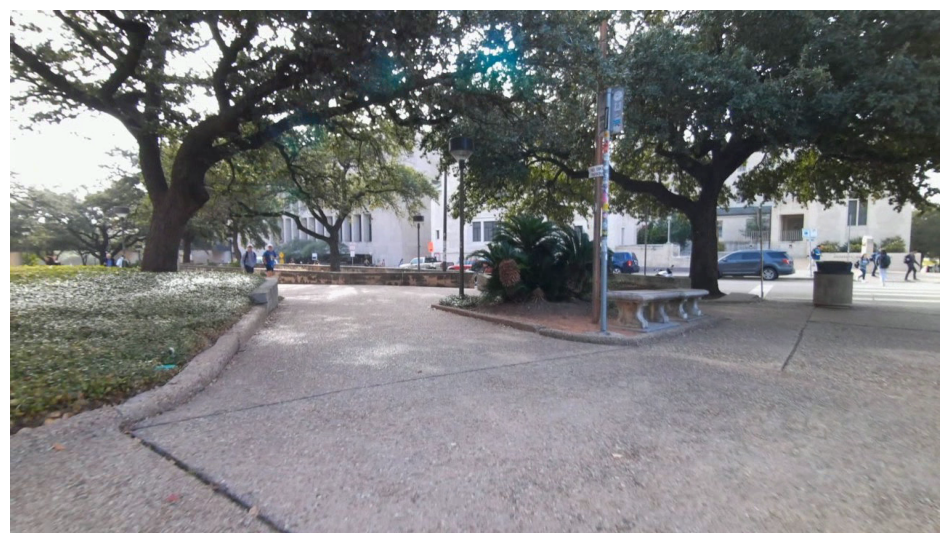

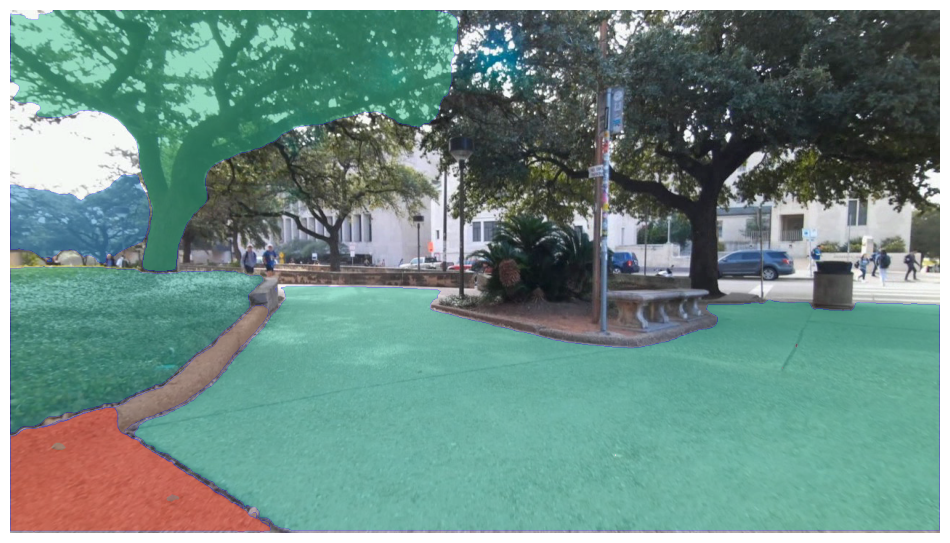

Generating captions...


  0%|          | 0/6 [00:00<?, ?it/s]

Extracting embeddings...


  0%|          | 0/6 [00:00<?, ?it/s]

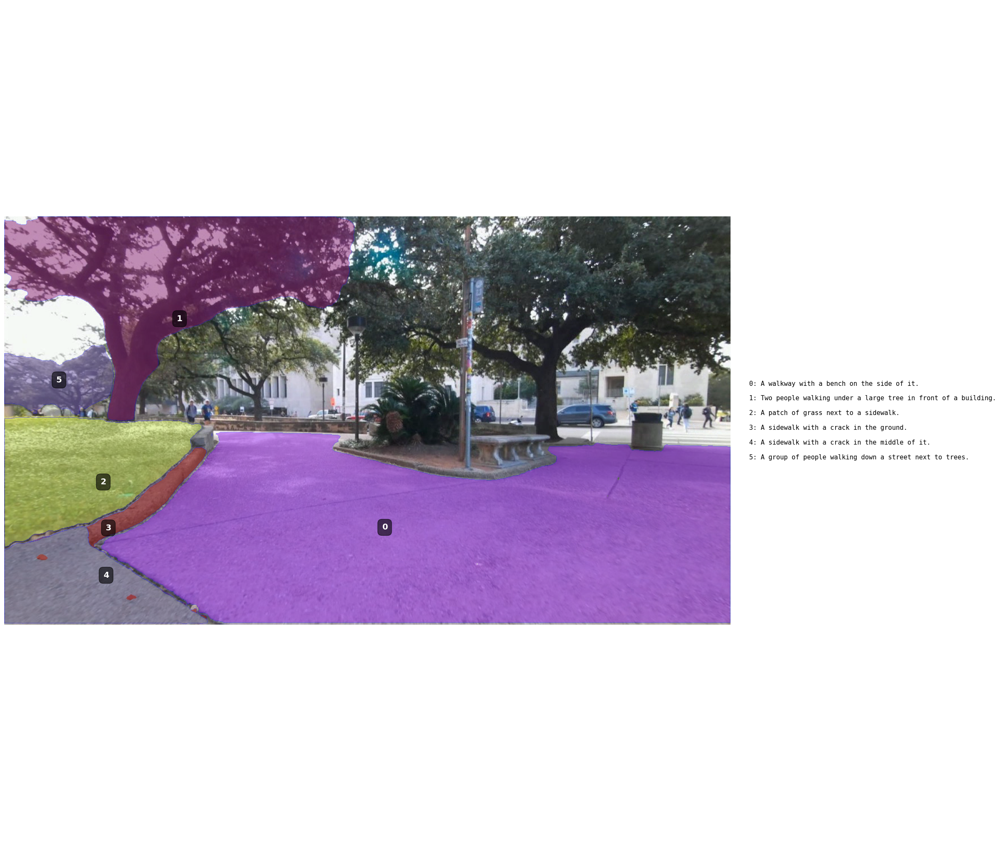

Frame 2: /home/denis_fatykhov/Projects/vizEnc/data/scand_spot_fountain-lib/output_frames/frame_000002_t0.667.png


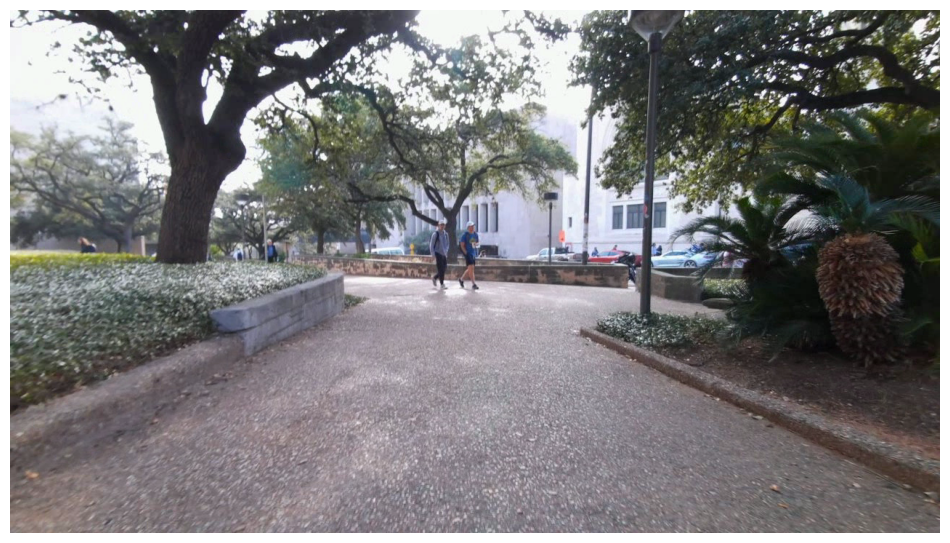

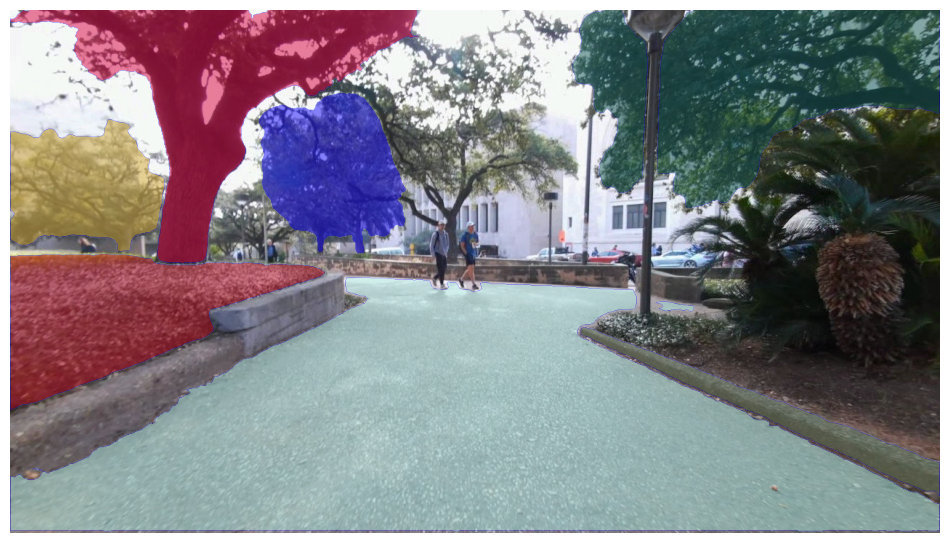

Generating captions...


  0%|          | 0/7 [00:00<?, ?it/s]

Extracting embeddings...


  0%|          | 0/7 [00:00<?, ?it/s]

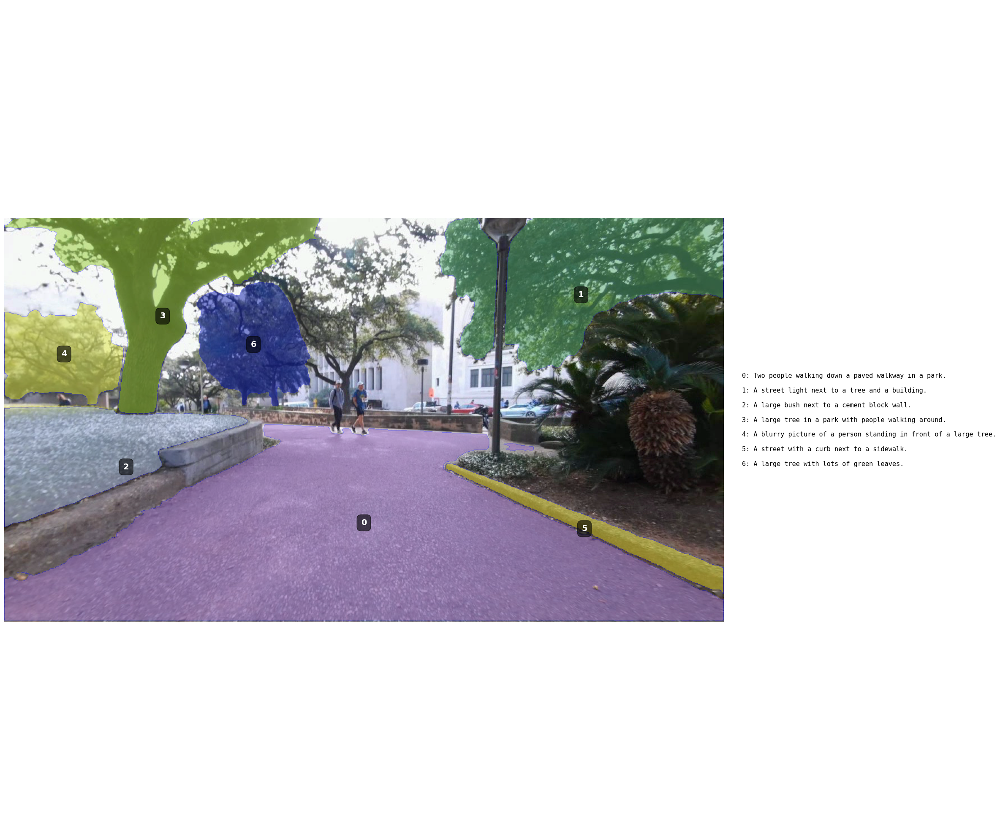

In [13]:
mask_db = []

for index, frame in enumerate(frames):
    if index == 0: continue
    print(f"Frame {index}: {frame}")
    image = Image.open(frame).convert("RGB")

    plt.figure(figsize=(12, 12))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    masks = mask_generator.generate(np.array(image))

    plt.figure(figsize=(12, 12))
    plt.imshow(image)
    show_anns(masks)
    plt.axis('off')
    plt.show() 

    masks = process_masks_with_features(
        image, masks,
        fl_model, fl_processor, device,
        dino_model, dino_processor, device
    )

    visualize_masks_with_descriptions(image, masks)
    mask_db.append((frame.name, masks))
    
    if index == 2:
        break

Frame 0: 6 objects
Frame 1: 7 objects
Total: 13 objects, dim: 768


/home/denis_fatykhov/Projects/vizEnc/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/denis_fatykhov/Projects/vizEnc/.venv/lib/python3.12/site-packages/numba/np/ufunc/parallel.py:373: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
/home/denis_fatykhov/Projects/vizEnc/.venv/lib/python3.12/site-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


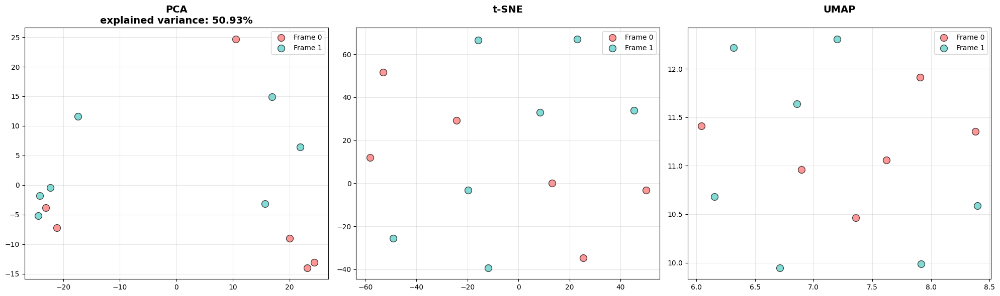

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

# 1. Берем только первые 2 кадра
frame0_embeddings = np.array([mask['embedding'] for mask in mask_db[0][1]])
frame1_embeddings = np.array([mask['embedding'] for mask in mask_db[1][1]])

# Объединяем
all_embeddings = np.vstack([frame0_embeddings, frame1_embeddings])

# Метки для цветов (0 = frame 0, 1 = frame 1)
labels = np.array([0] * len(frame0_embeddings) + [1] * len(frame1_embeddings))
colors = ['#FF6B6B', '#4ECDC4']  # красный для frame 0, бирюзовый для frame 1

print(f"Frame 0: {len(frame0_embeddings)} objects")
print(f"Frame 1: {len(frame1_embeddings)} objects")
print(f"Total: {len(all_embeddings)} objects, dim: {all_embeddings.shape[1]}")

# 2. Применяем редукцию размерности
pca = PCA(n_components=2)
tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(all_embeddings)-1))
umap = UMAP(n_components=2, random_state=42)

embeddings_pca = pca.fit_transform(all_embeddings)
embeddings_tsne = tsne.fit_transform(all_embeddings)
embeddings_umap = umap.fit_transform(all_embeddings)

# 3. Визуализация
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

methods = [
    (embeddings_pca, 'PCA', f'explained variance: {pca.explained_variance_ratio_.sum():.2%}'),
    (embeddings_tsne, 't-SNE', ''),
    (embeddings_umap, 'UMAP', '')
]

for ax, (embeddings_2d, title, subtitle) in zip(axes, methods):
    # Frame 0
    ax.scatter(embeddings_2d[labels==0, 0], embeddings_2d[labels==0, 1],
                c=colors[0], label='Frame 0', alpha=0.7, s=100, edgecolors='black')
    # Frame 1
    ax.scatter(embeddings_2d[labels==1, 0], embeddings_2d[labels==1, 1],
                c=colors[1], label='Frame 1', alpha=0.7, s=100, edgecolors='black')

    ax.set_title(f'{title}\n{subtitle}', fontsize=14, weight='bold')
    ax.legend()
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Дополнительно - аннотировать номера объектов:
# # Добавить номера объектов на график
# for i, (x, y) in enumerate(embeddings_2d):
#     ax.annotate(str(i), (x, y), fontsize=8, ha='center', va='center')

Found 3 matches:
  Frame0[1] -> Frame1[3]: 0.751
    'Two people walking under a large tree in front of a building.' -> 'A large tree in a park with people walking around.'
  Frame0[2] -> Frame1[2]: 0.773
    'A patch of grass next to a sidewalk.' -> 'A large bush next to a cement block wall.'
  Frame0[5] -> Frame1[4]: 0.775
    'A group of people walking down a street next to trees.' -> 'A blurry picture of a person standing in front of a large tree.'


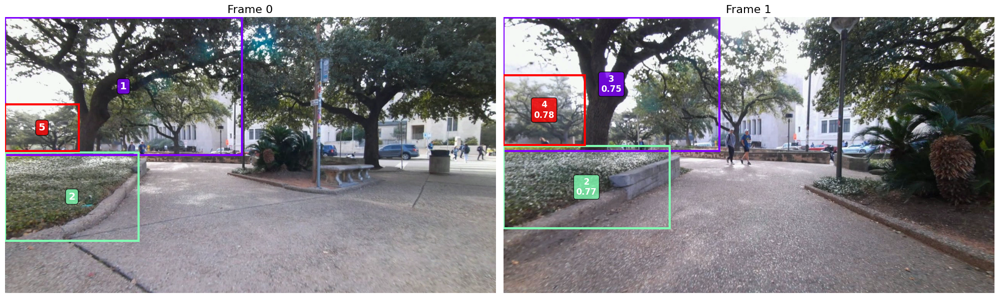

[(1, 3, np.float32(0.75057864)),
 (2, 2, np.float32(0.77256775)),
 (5, 4, np.float32(0.77534616))]

In [15]:
# Жадный алгоритм для matching объектов между кадрами
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def greedy_match_objects(frame0_embeddings, frame1_embeddings, threshold=0.7):
    """Жадное сопоставление объектов по косинусному расстоянию"""
    sim_matrix = cosine_similarity(frame0_embeddings, frame1_embeddings)

    matches = []
    used_frame1 = set()

    # Для каждого объекта из frame0
    for i in range(len(frame0_embeddings)):
        best_j = None
        best_sim = threshold

        for j in range(len(frame1_embeddings)):
            if j not in used_frame1 and sim_matrix[i, j] > best_sim:
                best_sim = sim_matrix[i, j]
                best_j = j

        if best_j is not None:
            matches.append((i, best_j, best_sim))
            used_frame1.add(best_j)

    return matches

def visualize_object_tracking(image0, masks0, image1, masks1, matches):
    """Визуализация перемещения объектов со стрелками"""
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(20, 10))

    # Frame 0
    ax0.imshow(image0)
    ax0.set_title('Frame 0', fontsize=16)
    ax0.axis('off')

    # Frame 1
    ax1.imshow(image1)
    ax1.set_title('Frame 1', fontsize=16)
    ax1.axis('off')

    # Рисуем соответствия
    colors = plt.cm.rainbow(np.linspace(0, 1, len(matches)))

    for (i, j, sim), color in zip(matches, colors):
        # Центры bbox
        x0, y0, w0, h0 = masks0[i]['bbox']
        x1, y1, w1, h1 = masks1[j]['bbox']

        center0 = (x0 + w0/2, y0 + h0/2)
        center1 = (x1 + w1/2, y1 + h1/2)

        # Bbox на обоих кадрах
        rect0 = mpatches.Rectangle((x0, y0), w0, h0,
                                    linewidth=3, edgecolor=color, facecolor='none')
        rect1 = mpatches.Rectangle((x1, y1), w1, h1,
                                    linewidth=3, edgecolor=color, facecolor='none')
        ax0.add_patch(rect0)
        ax1.add_patch(rect1)

        # Номера и similarity
        ax0.text(center0[0], center0[1], str(i),
                color='white', fontsize=14, weight='bold',
                ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))

        ax1.text(center1[0], center1[1], f"{j}\n{sim:.2f}",
                color='white', fontsize=12, weight='bold',
                ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))

    plt.tight_layout()
    plt.show()

    return matches

# Использование:
frame0_embeddings = np.array([mask['embedding'] for mask in mask_db[0][1]])
frame1_embeddings = np.array([mask['embedding'] for mask in mask_db[1][1]])

matches = greedy_match_objects(frame0_embeddings, frame1_embeddings, threshold=0.7)

print(f"Found {len(matches)} matches:")
for i, j, sim in matches:
    print(f"  Frame0[{i}] -> Frame1[{j}]: {sim:.3f}")
    print(f"    '{mask_db[0][1][i]['description']}' -> '{mask_db[1][1][j]['description']}'")

# Визуализация
image0 = Image.open(frames[1]).convert("RGB")
image1 = Image.open(frames[2]).convert("RGB")

visualize_object_tracking(image0, mask_db[0][1], image1, mask_db[1][1], matches)

### Optimal Matching (Hungarian Algorithm) + Unsupervised Metrics

In [16]:
from scipy.optimize import linear_sum_assignment

def optimal_match_objects(frame0_embeddings, frame1_embeddings, threshold=0.7):
    """Оптимальное сопоставление через Hungarian algorithm"""
    sim_matrix = cosine_similarity(frame0_embeddings, frame1_embeddings)
    
    # Hungarian минимизирует cost → инвертируем similarity
    cost_matrix = 1 - sim_matrix
    
    # Венгерский алгоритм
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    
    matches = []
    for i, j in zip(row_ind, col_ind):
        sim = sim_matrix[i, j]
        if sim > threshold:
            matches.append((i, j, sim))
    
    return matches


def compute_unsupervised_metrics(matches, frame0_embeddings, frame1_embeddings, 
                                 frame0_bboxes, frame1_bboxes):
    """Метрики качества без ground truth"""
    
    if not matches:
        return {
            'avg_similarity': 0,
            'match_rate': 0,
            'spatial_consistency': 0,
            'confidence_score': 0,
            'n_matches': 0,
            'avg_displacement': 0
        }
    
    # 1. Средняя визуальная похожесть матчей (выше = лучше)
    avg_similarity = np.mean([sim for _, _, sim in matches])
    
    # 2. Match rate: сколько объектов смогли сматчить
    n0, n1 = len(frame0_embeddings), len(frame1_embeddings)
    matched_f0 = len(set(i for i, j, sim in matches))
    matched_f1 = len(set(j for i, j, sim in matches))
    match_rate = (matched_f0 + matched_f1) / (n0 + n1)
    
    # 3. Spatial consistency: близость bbox (объекты не телепортируются)
    displacements = []
    for i, j, sim in matches:
        x0, y0, w0, h0 = frame0_bboxes[i]
        x1, y1, w1, h1 = frame1_bboxes[j]
        center0 = np.array([x0 + w0/2, y0 + h0/2])
        center1 = np.array([x1 + w1/2, y1 + h1/2])
        displacement = np.linalg.norm(center1 - center0)
        displacements.append(displacement)
    
    avg_displacement = np.mean(displacements)
    # Нормализуем: чем меньше displacement, тем лучше (для соседних кадров)
    # Предполагаем max разумное движение = 200 пикселей между кадрами
    spatial_consistency = 1 - min(avg_displacement / 200, 1.0)
    
    # 4. Confidence score: комбинированная метрика
    confidence_score = (avg_similarity * 0.6 + 
                       match_rate * 0.2 + 
                       spatial_consistency * 0.2)
    
    return {
        'avg_similarity': avg_similarity,
        'match_rate': match_rate,
        'spatial_consistency': spatial_consistency,
        'avg_displacement': avg_displacement,
        'confidence_score': confidence_score,
        'n_matches': len(matches),
        'unmatched_f0': n0 - matched_f0,
        'unmatched_f1': n1 - matched_f1
    }

In [17]:
# Сравнение Greedy vs Hungarian Algorithm
frame0_bboxes = [m['bbox'] for m in mask_db[0][1]]
frame1_bboxes = [m['bbox'] for m in mask_db[1][1]]

print("=" * 60)
print("GREEDY ALGORITHM")
print("=" * 60)
greedy_matches = greedy_match_objects(frame0_embeddings, frame1_embeddings, threshold=0.7)
greedy_metrics = compute_unsupervised_metrics(
    greedy_matches, frame0_embeddings, frame1_embeddings,
    frame0_bboxes, frame1_bboxes
)

print(f"Matches found: {greedy_metrics['n_matches']}")
print(f"Average similarity: {greedy_metrics['avg_similarity']:.3f}")
print(f"Match rate: {greedy_metrics['match_rate']:.3f}")
print(f"Spatial consistency: {greedy_metrics['spatial_consistency']:.3f}")
print(f"Average displacement: {greedy_metrics['avg_displacement']:.1f} px")
print(f"Confidence score: {greedy_metrics['confidence_score']:.3f}")
print(f"Unmatched frame0: {greedy_metrics['unmatched_f0']}, frame1: {greedy_metrics['unmatched_f1']}")

print("\n" + "=" * 60)
print("HUNGARIAN ALGORITHM (Optimal)")
print("=" * 60)
hungarian_matches = optimal_match_objects(frame0_embeddings, frame1_embeddings, threshold=0.7)
hungarian_metrics = compute_unsupervised_metrics(
    hungarian_matches, frame0_embeddings, frame1_embeddings,
    frame0_bboxes, frame1_bboxes
)

print(f"Matches found: {hungarian_metrics['n_matches']}")
print(f"Average similarity: {hungarian_metrics['avg_similarity']:.3f}")
print(f"Match rate: {hungarian_metrics['match_rate']:.3f}")
print(f"Spatial consistency: {hungarian_metrics['spatial_consistency']:.3f}")
print(f"Average displacement: {hungarian_metrics['avg_displacement']:.1f} px")
print(f"Confidence score: {hungarian_metrics['confidence_score']:.3f}")
print(f"Unmatched frame0: {hungarian_metrics['unmatched_f0']}, frame1: {hungarian_metrics['unmatched_f1']}")

print("\n" + "=" * 60)
print("COMPARISON (Hungarian - Greedy)")
print("=" * 60)
print(f"Δ Matches: {hungarian_metrics['n_matches'] - greedy_metrics['n_matches']:+d}")
print(f"Δ Avg similarity: {hungarian_metrics['avg_similarity'] - greedy_metrics['avg_similarity']:+.3f}")
print(f"Δ Confidence: {hungarian_metrics['confidence_score'] - greedy_metrics['confidence_score']:+.3f}")
print(f"\n{'Hungarian is BETTER' if hungarian_metrics['confidence_score'] > greedy_metrics['confidence_score'] else 'Greedy is BETTER'} ✓")

GREEDY ALGORITHM
Matches found: 3
Average similarity: 0.766
Match rate: 0.462
Spatial consistency: 0.793
Average displacement: 41.3 px
Confidence score: 0.711
Unmatched frame0: 3, frame1: 4

HUNGARIAN ALGORITHM (Optimal)
Matches found: 3
Average similarity: 0.766
Match rate: 0.462
Spatial consistency: 0.793
Average displacement: 41.3 px
Confidence score: 0.711
Unmatched frame0: 3, frame1: 4

COMPARISON (Hungarian - Greedy)
Δ Matches: +0
Δ Avg similarity: +0.000
Δ Confidence: +0.000

Greedy is BETTER ✓



Hungarian algorithm matches:
  Frame0[1] -> Frame1[3]: 0.751
    'Two people walking under a large tree in front of a building.' -> 'A large tree in a park with people walking around.'
  Frame0[2] -> Frame1[2]: 0.773
    'A patch of grass next to a sidewalk.' -> 'A large bush next to a cement block wall.'
  Frame0[5] -> Frame1[4]: 0.775
    'A group of people walking down a street next to trees.' -> 'A blurry picture of a person standing in front of a large tree.'


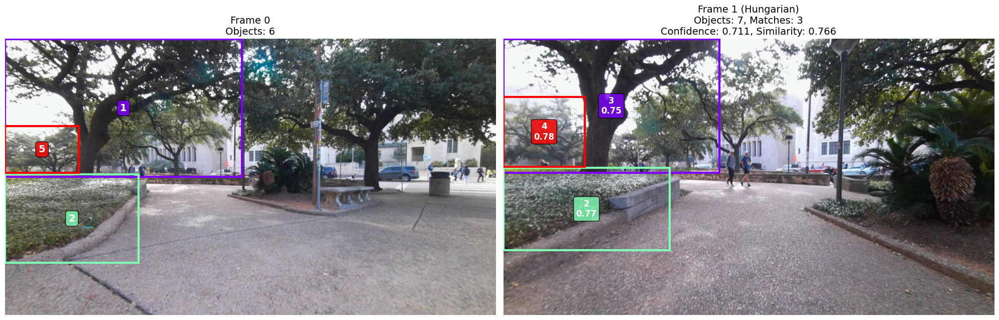

In [18]:
# Визуализация Hungarian matching с метриками
print(f"\nHungarian algorithm matches:")
for i, j, sim in hungarian_matches:
    print(f"  Frame0[{i}] -> Frame1[{j}]: {sim:.3f}")
    print(f"    '{mask_db[0][1][i]['description']}' -> '{mask_db[1][1][j]['description']}'")

# Обновленная визуализация с метриками в заголовке
def visualize_object_tracking_with_metrics(image0, masks0, image1, masks1, matches, metrics, title_suffix=""):
    """Визуализация перемещения объектов с метриками"""
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(20, 10))
    
    # Заголовки с метриками
    title0 = f'Frame 0\nObjects: {len(masks0)}'
    title1 = f'Frame 1 {title_suffix}\nObjects: {len(masks1)}, Matches: {metrics["n_matches"]}\n'
    title1 += f'Confidence: {metrics["confidence_score"]:.3f}, Similarity: {metrics["avg_similarity"]:.3f}'
    
    ax0.imshow(image0)
    ax0.set_title(title0, fontsize=14)
    ax0.axis('off')
    
    ax1.imshow(image1)
    ax1.set_title(title1, fontsize=14)
    ax1.axis('off')
    
    # Рисуем соответствия
    colors = plt.cm.rainbow(np.linspace(0, 1, len(matches)))
    
    for (i, j, sim), color in zip(matches, colors):
        # Центры bbox
        x0, y0, w0, h0 = masks0[i]['bbox']
        x1, y1, w1, h1 = masks1[j]['bbox']
        
        center0 = (x0 + w0/2, y0 + h0/2)
        center1 = (x1 + w1/2, y1 + h1/2)
        
        # Bbox на обоих кадрах
        rect0 = mpatches.Rectangle((x0, y0), w0, h0,
                                    linewidth=3, edgecolor=color, facecolor='none')
        rect1 = mpatches.Rectangle((x1, y1), w1, h1,
                                    linewidth=3, edgecolor=color, facecolor='none')
        ax0.add_patch(rect0)
        ax1.add_patch(rect1)
        
        # Номера и similarity
        ax0.text(center0[0], center0[1], str(i),
                color='white', fontsize=14, weight='bold',
                ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))
        
        ax1.text(center1[0], center1[1], f"{j}\n{sim:.2f}",
                color='white', fontsize=12, weight='bold',
                ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor=color, alpha=0.8))
    
    plt.tight_layout()
    plt.show()

# Визуализация Hungarian
visualize_object_tracking_with_metrics(
    image0, mask_db[0][1], 
    image1, mask_db[1][1], 
    hungarian_matches, 
    hungarian_metrics,
    title_suffix="(Hungarian)"
)